In [1]:
import scanpy as sc
import pandas as pd
import numpy as np

In [2]:
adata1 = sc.read_h5ad('../data/covid19/subdata/RNA_1.h5ad')
adata2 = sc.read_h5ad('../data/covid19/subdata/RNA_4.h5ad')
# subdata1 = adata1[adata1.obs['minor_subset'].isin(['CD8.TEMRA','CD8.NAIVE','CD4.NAIVE'])]
# subdata2 = adata2[adata2.obs['minor_subset'].isin(['CD8.TEMRA','CD4.NAIVE'])]

In [35]:
adata1.obs['minor_subset'].value_counts()

CD4.NAIVE                   15413
cMono                       14689
CD4.TCM                     12388
NK.CD16hi                    8744
CD8.TEMRA                    6109
ncMono                       4073
CD8.NAIVE                    3080
CD8.TEM                      2766
B.NAIVE                      1397
cDC                          1367
CD4.TREG                     1301
CD8.mitohi                   1286
NK.mitohi                    1263
MAIT                         1254
CD8.TCM.CCL5                 1239
NK.CD56hi.CD16int.XCL1/2     1097
CD4.TEFF                      989
B.INT                         932
CD4.TEM/TEMRA                 906
B.MEM                         891
CD8.TCM                       826
DP                            825
pDC                           663
GDT.VD2                       622
DN                            548
GDT.VD2neg                    489
NK.CD16int                    411
NK.cyc                        302
nan                           244
CD8.TEFF.proli

In [418]:
allct = adata1.obs['minor_subset'].value_counts().keys()
# cts = allct[6:9]
subdata1 = adata1[adata1.obs['minor_subset'].isin(['CD4.TCM','CD4.TEFF','CD4.TREG'])]
subdata2 = adata2[adata2.obs['minor_subset'].isin(['CD4.TCM','CD4.TEFF','CD4.TREG'])]

In [306]:
def scanpypp(adata):
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    # adata.var["mt"] = adata.var_names.str.startswith("MT-")
    # sc.pp.calculate_qc_metrics(
    # adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True)
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    # sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
    # sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")
    sc.pp.highly_variable_genes(adata,min_mean=0.15,max_mean=2.5,min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    adata = adata[:,adata.var.highly_variable]
    sc.pp.scale(adata)
    sc.pp.pca(adata, n_comps=50)
    return adata

In [419]:
adata = sc.concat([subdata1,subdata2],axis=0)

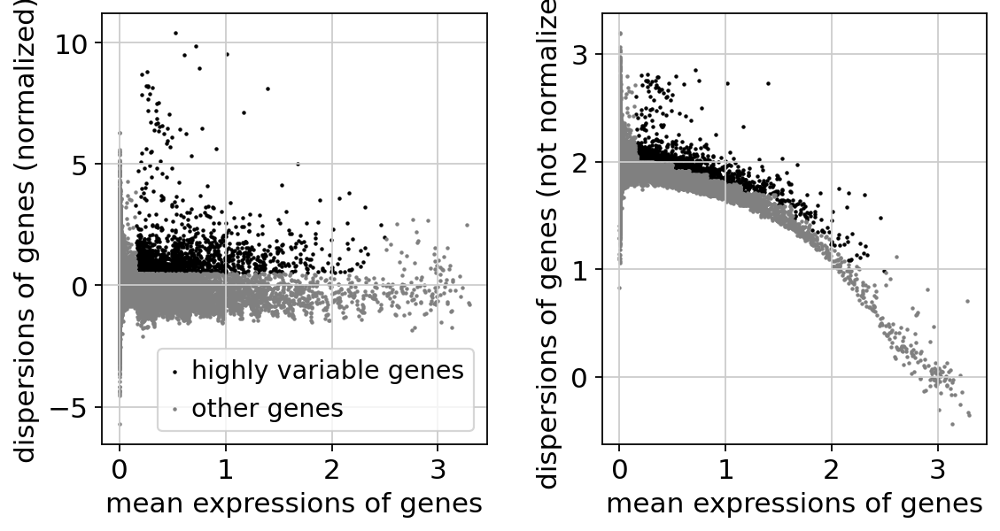

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [420]:
adata_pp = scanpypp(adata.copy())

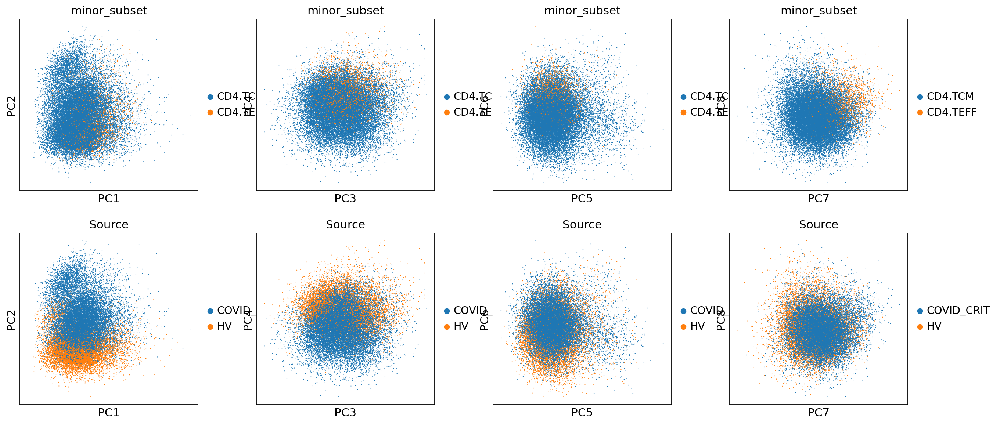

In [392]:
sc.pl.pca(adata_pp, components=['1,2','3,4','5,6','7,8'],color=['minor_subset','Source'])


/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
2025-02-10 19:26:49,447 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-10 19:27:02,001 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-10 19:27:02,151 - harmonypy - INFO - Iteration 1 of 10
2025-02-10 19:27:17,661 - harmonypy - INFO - Iteration 2 of 10
2025-02-10 19:27:34,514 - harmonypy - INFO - Iteration 3 of 10
2025-02-10 19:27:49,750 - harmonypy - INFO - Iteration 4 of 10
2025-02-10 19:27:59,253 - harmonypy - INFO - Iteration 5 of 10
2025-02-10 19:28:07,398 - harmonypy - INFO - Iteration 6 of 10
2025-02-10 19:28:15,232 - harmonypy - INFO - Iteration 7 of 10
2025-02-10 19:28:22,282 - harmonypy - INFO - Iteration 8 of 10
2025-02-10 19:28:29,076 - harmonypy - INFO - Iteration 9 of 10
2025-02-10 19:28:36,839 - harmonypy 

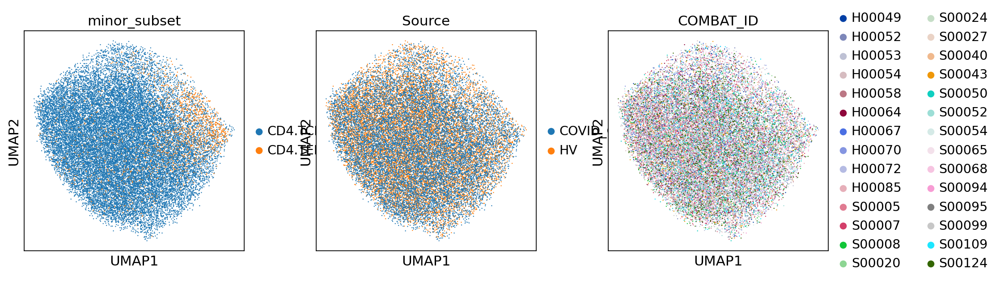

In [400]:
adata_pp = adata_pp[:,good_genes]
sc.pp.pca(adata_pp,n_comps=50)
sc.external.pp.harmony_integrate(adata_pp, key='COMBAT_ID')
sc.pp.neighbors(adata_pp, n_neighbors=20, key_added='harmony',use_rep='X_pca_harmony')
sc.tl.umap(adata_pp, neighbors_key='harmony')
# sc.pp.neighbors(adata_pp, n_neighbors=20)
# sc.tl.umap(adata_pp)
# # sc.tl.leiden(adata_subb,resolution=0.2)
sc.pl.umap(adata_pp, color=['minor_subset','Source','COMBAT_ID'])

In [115]:
adata_pp.uns['COMBAT_ID_colors'] = None

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


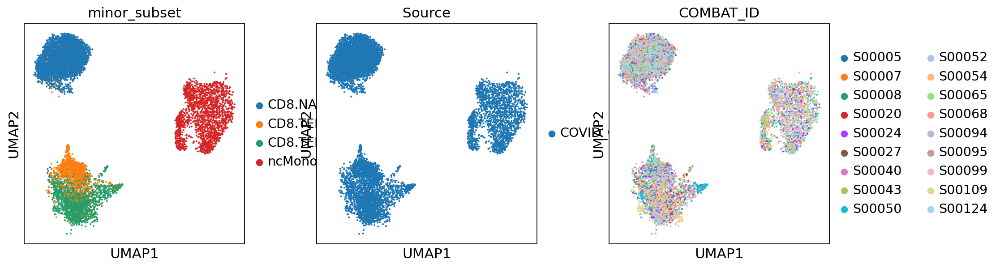

In [117]:

sc.pl.umap(adata_pp[adata_pp.obs['Source']!='HV'], color=['minor_subset','Source','COMBAT_ID'])

In [ ]:
from scalable_gcca import learn
ppdata = {}
for i in rnadata.keys():
# print('before pp',i,rnadata[i].shape
    # print(len(rnadata[i]))
    # if len(rnadata[i]) not in ([968,1069,446,653]):
    #     continue
    if len(rnadata[i]) < 100:
        continue
    
    if rnadata[i].shape[0] > 500:
        
        rand = np.random.choice(rnadata[i].shape[0]-1, 500,replace=False)
        rnadata[i] = rnadata[i][rand,:]

    adata = rnadata[i].copy()
    # print(sum(adata.X.toarray()[:100,:100]))
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata,min_disp=0.5)

    # adata = adata[:,adata.var.highly_variable]
    # sc.pp.scale(adata)
    # sc.pp.pca(adata, n_comps=100)
    # ppdata[i] = sparse.csr_matrix(adata.obsm['X_pca'].T)

    ppdata[i] = adata[:,adata.var['highly_variable']]
    gene_list  = gene_list & set(list(ppdata[i].var_names))

    data_cc = {}
    if len(ppdata.keys()) < 2:
        for i in ppdata.keys():
            # temp = normalize(ppdata[i][:5,:].T,copy=True)
            data_cc[i] = pd.DataFrame(data=temp,index=rnadata[i].obs_names,columns=['CC_'+str(k+1) for k in range(5)])

    # for i in ppdata.keys():
    #     if isspmatrix_csr(ppdata[i].X):
    #         ppdata[i] = ppdata[i][:,list(gene_list)].X.toarray().T
    #     else:
    #         ppdata[i] = ppdata[i][:,list(gene_list)].X.T
        
    # logging.root.setLevel(level=logging.INFO)
    # gcca = GCCA(n_components=5)
    # gcca.fit(ppdata)
    # cca_loading = gcca.h_list
    # print(gcca.eigvals[:5])

    # print(ppdata.values())
    model = learn(list(ppdata.values()), k=5, epochs=10, verbose=False)
    cca_loading = model.Qs

In [ ]:
import numpy as np
from scipy.spatial import distance
from sklearn.mixture import GaussianMixture

def bhattacharyya_dist(mu1, mu2, Sigma1, Sigma2):
    Sig = (Sigma1+Sigma2)/2
    print(mu1.shape,Sigma1.shape)
    if len(mu1) ==1:
        ldet_s = np.linalg.det(Sig)
        ldet_s1 = np.linalg.det(Sigma1)
        ldet_s2 = np.linalg.det(Sigma2)
        d1 = distance.mahalanobis(mu1, mu2, np.linalg.inv(Sig))**2/8
        d2 = 0.5*np.log(ldet_s) - 0.25*np.log(ldet_s1) - 0.25*np.log(ldet_s2)
    else:
        d1 = distance.mahalanobis(mu1, mu2, 1/Sig)**2/8
        d2 = 0.5*np.log(1/Sig) - 0.25*np.log(1/Sigma1) - 0.25*np.log(1/Sigma2)
    return d1+d2


def gm1or2(x1,x2):
    x1 =  x1.reshape(-1, 1)
    x2 =  x2.reshape(-1, 1)
    gmm = GaussianMixture(1, covariance_type='full')
    ll1 = gmm.fit(x1).lower_bound_ * len(x1) / (len(x1)+len(x2))

    ll2 = gmm.fit(x2).lower_bound_ * len(x1) / (len(x1)+len(x2))

    ll = gmm.fit(np.concatenate([x1,x2])).lower_bound_ 

    ll_gain = (ll1 + ll2) - ll

    return ll_gain


In [ ]:
from sklearn.cross_decomposition import CCA,PLSCanonical,PLSRegression

def pls(data1, data2):
    plsc = PLSCanonical(n_components=5)
    plsc.fit(data1, data2)
    cell_rep1, cell_rep2 = plsc.x_weights_, plsc.y_weights_
    diff = {}
    for i in range(cell_rep1.shape[1]):
        diff[i+1] = gm1or2(cell_rep1[:,1],cell_rep2[:,1])

    gene_vec1, gene_vec2 = plsc.transform(data1, data2)
    gene_vec1 = pd.DataFrame(index=data1.index, data=gene_vec1)
    gene_vec2 = pd.DataFrame(index=data2.index, data=gene_vec2)
    gene_vec = [gene_vec1, gene_vec2]

    bio_genes, cnd_genes = set(), set()

    for k in range(2):

        data = gene_vec[k]
        iqr = data.quantile([0.25, 0.5, 0.75])
        iqr.loc['iqr', :] = (iqr.loc[0.75, :] - iqr.loc[0.25, :])
        iqr.loc['min', :] = iqr.loc[0.25, :]-iqr.loc['iqr', :]
        iqr.loc['max', :] = iqr.loc[0.75, :]+iqr.loc['iqr', :]

        for i in diff.key():
            if diff[i] > 0:
                cnd_genes.update(data[data.iloc[:,0]<iqr.loc['min',0]].index)
                cnd_genes.update(data[data.iloc[:,0]>iqr.loc['max',0]].index)
            else:
                bio_genes.update(data[data.iloc[:,i]<iqr.loc['min',i]].index)
                bio_genes.update(data[data.iloc[:,i]>iqr.loc['max',i]].index)
    
    return cnd_genes, bio_genes, plsc, diff
    # if iter == 1 and len(cnd_genes) > 0:
    #     gene_list = bio_genes.difference(cnd_genes)
    # if iter == 2:
    #     gene_list 

In [ ]:
def clustering(ce1, ce2):
    

In [ ]:
from sklearn.preprocessing import normalize

data1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names].X.toarray()).T,columns=subdata1.obs_names,index=adata_pp.var_names)
data2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names].X.toarray()).T,columns=subdata2.obs_names,index=adata_pp.var_names)

cnd_genes, bio_genes, plsc, diff = pls(data1, data2)
if len(cnd_genes) == 0:
    stop = True
gene_list = list(bio_genes.difference(cnd_genes))
cnd_genes, bio_genes, plsc, diff = pls(data1.loc[gene_list,:], data2.loc[gene_list,:])
cell_rep1, cell_rep2 = plsc.x_weights_, plsc.y_weights_
cell_rep1 = pd.DataFrame(index=data1.columns,columns=range(1,6),data=cell_rep1)
cell_rep2 = pd.DataFrame(index=data2.columns,columns=range(1,6),data=cell_rep2)
diff = pd.Series(diff)
cell_rep1, cell_rep2 = cell_rep1[:,diff<0], cell_rep2[:,diff<0]





In [421]:
from sklearn.cross_decomposition import CCA,PLSCanonical,PLSRegression
from sklearn.preprocessing import normalize

# reference = np.dot(adata[:,list(gene_list)].X.T,adata.obsm['X_pca'][:,0])
# sc.tl.pca(adata_pp, n_comps=50)
# pc1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names].obsm['X_pca']).T,columns=subdata1.obs_names)
# pc2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names].obsm['X_pca']).T,columns=subdata2.obs_names)

pc1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names].X.toarray()).T,columns=subdata1.obs_names,index=adata_pp.var_names)
pc2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names].X.toarray()).T,columns=subdata2.obs_names,index=adata_pp.var_names)

# good_genes = list(good_genes)
# good_genes = adata_pp[:,good_genes].var_names
# pc1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names,good_genes].X.toarray()).T,columns=subdata1.obs_names,index=good_genes)
# pc2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names,good_genes].X.toarray()).T,columns=subdata2.obs_names,index=good_genes)

# rand = np.random.choice(pc1.shape[1]-1, 1000, replace=False)
# pc1 = pc1.iloc[:,rand]
# rand = np.random.choice(pc2.shape[1]-1, 1000, replace=False)
# pc2 = pc2.iloc[:,rand]

# cca = CCA(n_components=5)
# cca.fit(pc1,pc2)
plsc = PLSCanonical(n_components=5)
plsc.fit(pc1,pc2)
# plsc = PLSRegression(n_components=5)
# plsc.fit(pc1,pc2)



PLSCanonical(n_components=5)

In [127]:
from Classifier.gcca import GCCA
# model = learn(list(ppdata.values()), k=5, epochs=10, verbose=False)
# cca_loading = model.Qs
gcca = GCCA(n_components=5)
# rand = np.random.choice(pc1.shape[1]-1, 1000, replace=False)
# pc1 = pc1.iloc[:,rand]
# rand = np.random.choice(pc2.shape[1]-1, 1000, replace=False)
# pc2 = pc2.iloc[:,rand]
gcca.fit([pc1,pc2])
# cca_vector = gcca.transform([ppdata[i] for i in usedata[k]])
# print(len([ppdata[i] for i in usedata[k]]))
# print(dict(zip(usedata[k],[ppdata[i] for i in usedata[k]])))
# cca_vector = gcca.fit_transform(dict(zip(usedata[k],[ppdata[i] for i in usedata[k]])))
# cca_loading = gcca.h_list

In [128]:
adata_pp.varm['PCs'].shape

(938, 50)

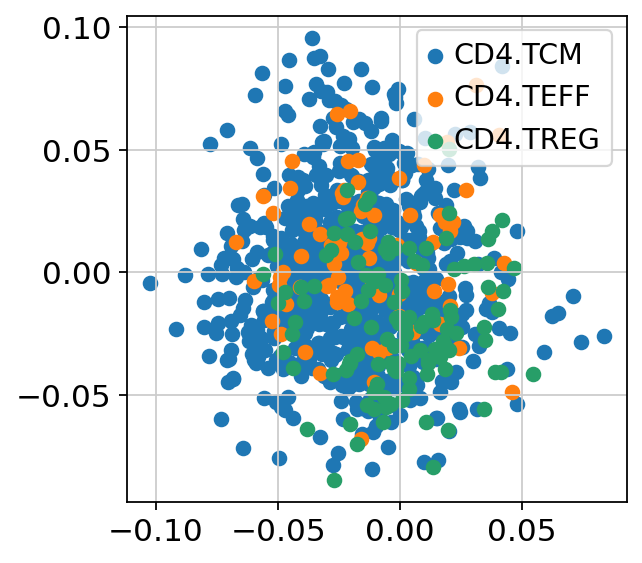

In [212]:
import matplotlib.pyplot as plt

# cca_loading = cca.x_loadings_

# cca_loading = pd.DataFrame(index=pc1.columns,data=gcca.h_list[0])
cca_loading = pd.DataFrame(index=pc2.columns,data=plsc.y_weights_)
# plt.hist(cca_loading.iloc[:,0],bins=100)
# plt.scatter(cca_loading.iloc[:,0],cca_loading.iloc[:,1])
subdata = subdata2[pc2.columns,:]
for ct in subdata.obs['minor_subset'].cat.categories:
    
    # cca_loading = pd.DataFrame(index=pc1.columns,data=plsc.x_weights_)
    # subdata = subdata1[pc1.columns,:]
    plt.scatter(cca_loading[subdata.obs['minor_subset']==ct].iloc[:,0],cca_loading[subdata.obs['minor_subset']==ct].iloc[:,1])
# plt.scatter(cca_loading[subdata.obs['minor_subset']=='CD8.TEMRA'].iloc[:,0],cca_loading[subdata.obs['minor_subset']=='CD8.TEMRA'].iloc[:,1])
# plt.scatter(cca_loading[subdata.obs['minor_subset']=='CD8.NAIVE'].iloc[:,0],cca_loading[subdata.obs['minor_subset']=='CD8.NAIVE'].iloc[:,1])
# plt.scatter(cca_loading[subdata.obs['minor_subset']=='CD8.TEM'].iloc[:,0],cca_loading[subdata.obs['minor_subset']=='CD8.TEM'].iloc[:,1])
# plt.legend(['CD8.TEMRA','CD8.NAIVE','CD8.TEM'])
plt.legend(subdata.obs['minor_subset'].cat.categories)
plt.show()

In [12]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

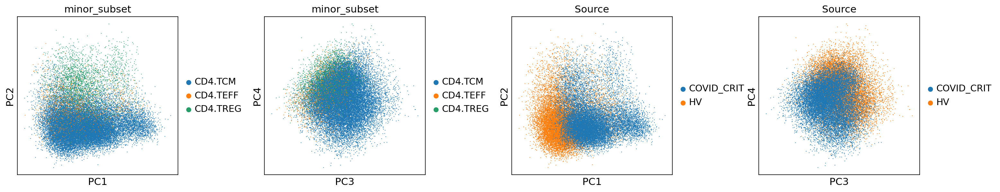

In [422]:
# subdata = subdata1[pc1.columns,:]
subdata = sc.concat([subdata1[pc1.columns,:],subdata2[pc2.columns,:]])
# subdata.obsm['X_pca'] = np.concatenate([plsc.x_weights_,plsc.y_weights_])
subdata.obsm['X_pca'] = np.concatenate([plsc.x_loadings_, plsc.y_loadings_])

sc.pl.pca(subdata,components=['1,2','3,4'],color=['minor_subset','Source'],wspace=0.4)


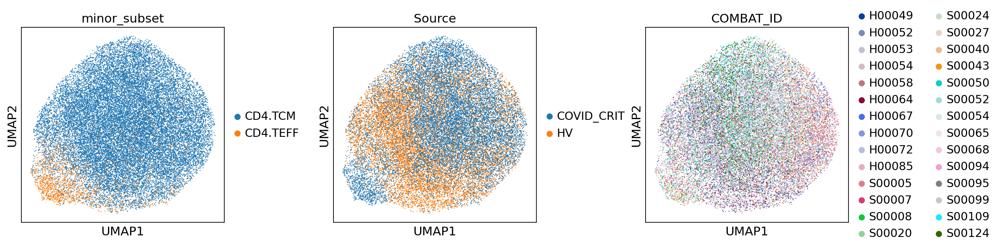

In [396]:
# sc.pp.neighbors(subdata)
# sc.tl.umap(subdata)
# # sc.pl.umap(subdata,color='minor_subset')
sc.pl.umap(subdata,color=['minor_subset','Source','COMBAT_ID'],wspace=0.4)

# sc.tl.leiden(subdata,resolution=0.13)
# sc.pl.umap(subdata,color=['minor_subset','Source','leiden'],wspace=0.4)
# sc.pl.pca(subdata,components=['1,2'],color=['minor_subset','leiden','Source'],wspace=0.4)

In [476]:
cell_rep1, cell_rep2 = plsc.x_weights_, plsc.y_weights_
# plt.hist(cell_rep1,bins=100)
# plt.hist(cell_rep2,bins=100)
# plt.show()

# overlap = bhattacharyya_dist(cell_rep1.mean[0],cell_rep2.mean[0],
#             cell_rep1.std()[0,0],cell_rep2.std()[0,0])

diff = gm1or2(cell_rep1[:,1],cell_rep2[:,1])


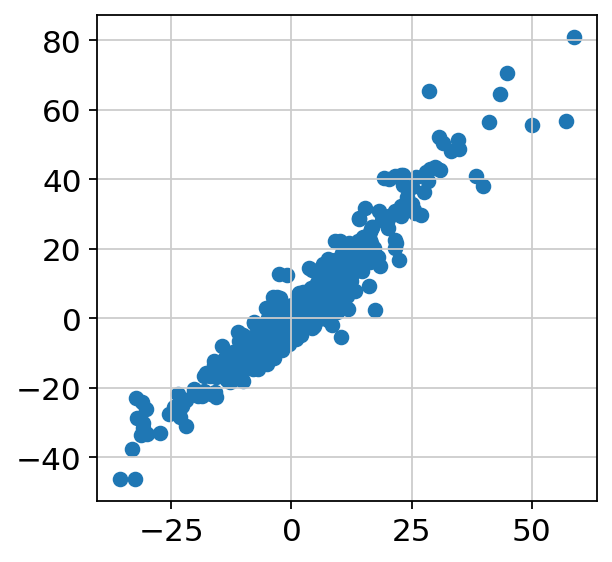

In [425]:
gene_vec1, gene_vec2 = plsc._x_scores, plsc._y_scores
# gene_vec1, gene_vec2 = plsc.transform(pc1, pc2)
gene_vec1 = pd.DataFrame(index=pc1.index, data=gene_vec1)
gene_vec2 = pd.DataFrame(index=pc2.index, data=gene_vec2)

# plt.hist(gene_vec1.iloc[:,1],bins=100)
# plt.hist(gene_vec2.iloc[:,1],bins=100)
# plt.hist(plsc.x_loadings_[:,1],bins=100)
plt.scatter(gene_vec1.iloc[:,0], gene_vec2.iloc[:,0])
plt.show()

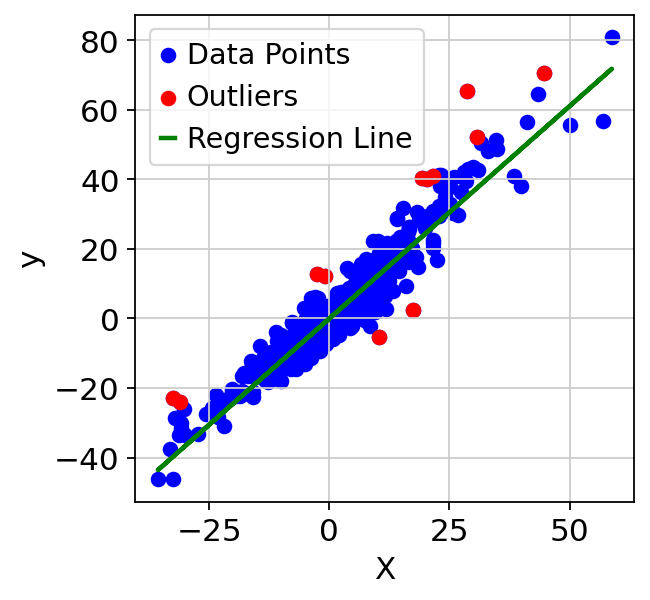

In [433]:
from sklearn.linear_model import LinearRegression


df = pd.DataFrame({'X': gene_vec1.iloc[:,0].squeeze(), 'y': gene_vec2.iloc[:,0]})

model = LinearRegression()
model.fit(df[['X']], df['y'])

# 计算预测值和残差
df['predicted'] = model.predict(df[['X']])
df['residuals'] = df['y'] - df['predicted']

# 设置异常点的阈值（例如3倍标准差）
threshold = 4 * df['residuals'].std()

# 识别异常点
outliers = df[np.abs(df['residuals']) > threshold]

plt.scatter(df['X'], df['y'], label='Data Points', color='blue')
plt.scatter(outliers['X'], outliers['y'], color='red', label='Outliers')
plt.plot(df['X'], df['predicted'], color='green', linewidth=2, label='Regression Line')
plt.xlabel('X')
plt.ylabel('y')
plt.legend()
plt.show()

In [406]:
good_genes = set()
# good_genes = set(pc1.index)

In [415]:
remove = True
# good_genes = set(good_genes)

data = gene_vec2
iqr = data.quantile([0.25, 0.5, 0.75])
iqr.loc['iqr', :] = (iqr.loc[0.75, :] - iqr.loc[0.25, :])
iqr.loc['min', :] = iqr.loc[0.25, :]-iqr.loc['iqr', :]
iqr.loc['max', :] = iqr.loc[0.75, :]+iqr.loc['iqr', :]

for i in range(0,5):
    if i == 0 and remove:
        good_genes.difference_update(data[data.iloc[:,0]<iqr.loc['min',0]].index)
        good_genes.difference_update(data[data.iloc[:,0]>iqr.loc['max',0]].index)
    else:
        good_genes.update(data[data.iloc[:,i]<iqr.loc['min',i]].index)
        good_genes.update(data[data.iloc[:,i]>iqr.loc['max',i]].index)
# good_genes = list(set(good_genes))


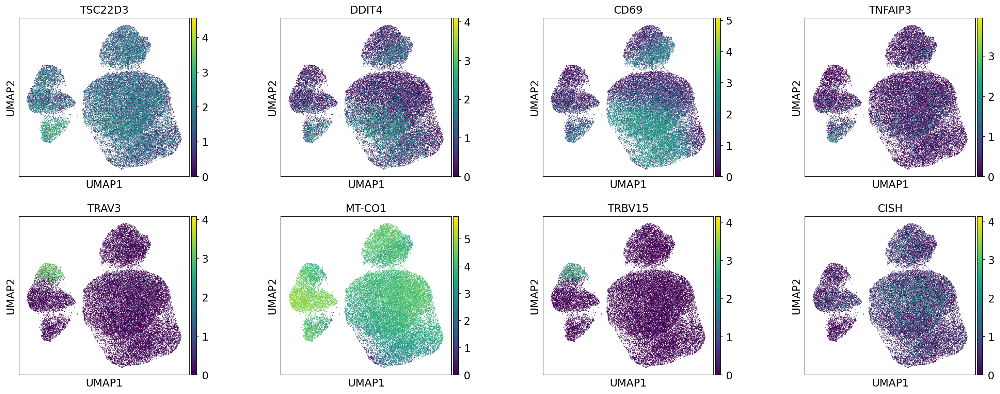

In [932]:
sc.pl.umap(subdata,color=markers,wspace=0.4)

In [18]:
sc.tl.rank_genes_groups(adata_pp, groupby='minor_subset',groups=['CD8.TEMRA','CD8.NAIVE','CD4.NAIVE'])
# adata_sub = adata_pp[adata_pp.obs['minor_subset']=='CD8.TEMRA']
# sc.tl.rank_genes_groups(adata_sub, groupby='Source')

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


In [869]:
adata_sub.obs['Source'].cat.categories

Index(['COVID_CRIT', 'HV'], dtype='object')

In [182]:
marker_genes = pd.DataFrame(adata_pp.uns['rank_genes_groups']['names']).iloc[:500,:].T
num = 10
markers = sum(np.array(marker_genes.iloc[:,:num]).tolist(),[])
markers1 =np.array(marker_genes.iloc[0,:num]).tolist()
markers2 = np.array(marker_genes.iloc[1,:num]).tolist()
markers3 = np.array(marker_genes.iloc[2,:num]).tolist()

KeyError: 'rank_genes_groups'

In [794]:
adata_pp.var_names

Index(['AL031282.2', 'TNFRSF1B', 'VPS13D', 'EFHD2', 'SPEN', 'C1QB', 'LDLRAP1',
       'STMN1', 'ZNF683', 'FGR',
       ...
       'MX1', 'COL6A2', 'S100B', 'MT-ND1', 'MT-ND2', 'MT-ATP8', 'MT-ND4',
       'MT-ND6', 'MT-CYB', 'AC011043.1'],
      dtype='object', length=786)

Text(0.5, 1.0, 'Gene values in the THIRD vector')

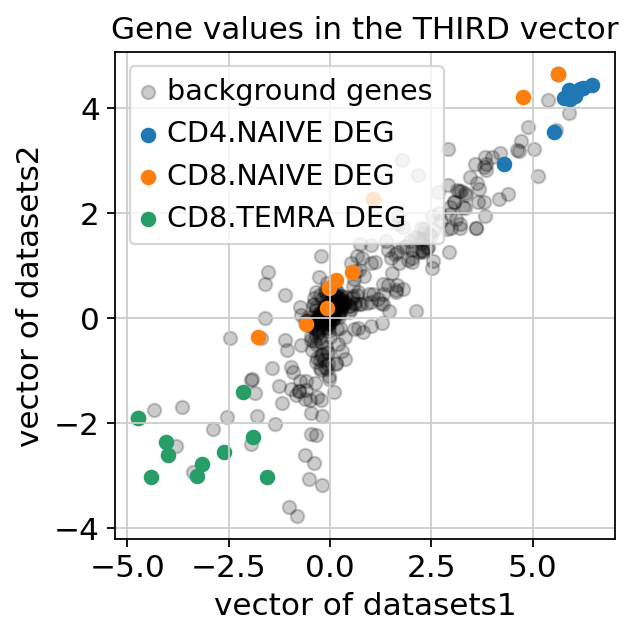

In [22]:
g1 = np.dot(pc1,plsc.x_rotations_) 
g2 = np.dot(pc2,plsc.y_rotations_) 
# markers = adata_pp.var_names.intersection(markers)
g1 = pd.DataFrame(index=adata_pp.var_names,data=g1)
g2 = pd.DataFrame(index=adata_pp.var_names,data=g2)
i = 0
plt.scatter(g1.loc[~g1.index.isin(markers),i],g2.loc[~g2.index.isin(markers),i],alpha=0.2,c='#000000')
plt.scatter(g1.loc[markers1,i],g2.loc[markers1,i],alpha=1)
plt.scatter(g1.loc[markers2,i],g2.loc[markers2,i],alpha=1)
plt.scatter(g1.loc[markers3,i],g2.loc[markers3,i],alpha=1)

# plt.scatter(g2[:,0],g2[:,1],alpha=0.5)
plt.legend(['background genes','CD4.NAIVE DEG','CD8.NAIVE DEG','CD8.TEMRA DEG',])
# plt.legend(['background genes','dataset2 DEG in CD8 TEMRA','dataset1 DEG in CD8 TEMRA',], loc='upper center')
plt.xlabel('vector of datasets1')
plt.ylabel('vector of datasets2')
plt.title('Gene values in the THIRD vector')

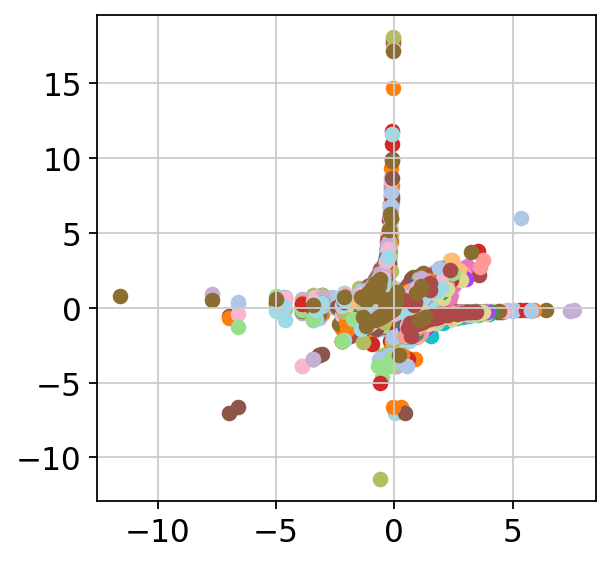

In [838]:
# plt.axes
for i in range(100):

    plt.scatter(adata_pp[subdata1.obs_names,markers1].X[i],adata_pp[subdata2.obs_names,markers1].X[i])
    plt.scatter(adata_pp[subdata1.obs_names,markers2].X[i],adata_pp[subdata2.obs_names,markers2].X[i])


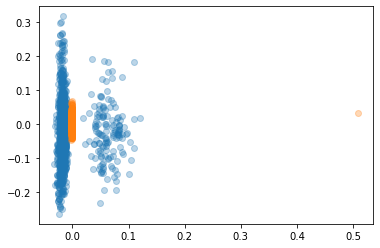

In [132]:
# cca.x_rotations_.shape
# cca._x_scores.shape
score = cca._x_scores
loading = cca.x_loadings_
# z = np.dot(pc1,score.T)
x_ = np.dot(score,loading.T)
score = plsc._x_scores
loading = plsc.x_loadings_
# score = gcca.transform([pc1,pc2])[0]
# loading = gcca.h_list[0]
x__ = np.dot(score,loading.T)

# x__ = np.outer(loading[:,0],score[:,0].T).T
plt.scatter(pc1.iloc[0,:],x_[0,:],alpha=0.3)
plt.scatter(pc1.iloc[1,:],x__[1,:],alpha=0.3)

# for i in range(len(pc1)):
#     # plt.scatter(pc1.iloc[i,:],x_[i,:],alpha=0.3)
#     plt.scatter(pc1.iloc[i,:],x__[i,:],alpha=0.3)

In [133]:
x___=np.dot(adata_pp.varm['PCs'],adata_pp[pc1.columns].obsm['X_pca'].T)
# corr = np.corrcoef(x___.T,adata_pp[pc1.columns,:].X.toarray())
corr = np.corrcoef(x__.T,pc1.values.T)
# cov = np.cov(x__.T,pc1.values.T)
# abs(corr[:938,938:]).trace()/938
# abs(corr[:100,100:]).trace()/100
abs(corr[:1000,1000:]).trace()/1000
# np.mean(corr[1000:,:1000]**2)

0.17733137482463132

In [79]:
corr[:1000,1000:][2,2]

0.4260631834548749

## Influence of variation and covariation (Sxx)

In [729]:
### influence of variation and covariation (Sxx)

import numpy as np
from sklearn.preprocessing import normalize

n = 4000
noise = int(n/2)
# 2 latents vars:
l1 = np.random.normal(size=(n,1))
l2 = np.random.normal(size=(n,1))+2
l3 = np.random.normal(size=(n,1))+4
l4 = np.random.normal(size=(n,1))+6
l0 = np.random.normal(size=(noise,1))

nvar = 400
latents1 = l1*2+np.ones(shape=(n,nvar))*0.1
latents2 = l2*2+np.ones(shape=(n,nvar))*0.1
latents3 = l3*2+np.ones(shape=(n,nvar))*0.1
latents4 = l4*2+np.ones(shape=(n,nvar))*0.1
latents0 = l0*2+np.ones(shape=(noise,nvar*2))*0.1


latents = np.concatenate([latents1, latents2],axis=1)
# latents = np.concatenate([latents, latents3],axis=1)
latents = np.concatenate([latents,latents0],axis=0)
X = latents + np.random.normal(size=latents.shape[1] * latents.shape[0]).reshape((latents.shape[0], latents.shape[1]))
latents = np.concatenate([latents1, latents4],axis=1)
# latents = np.concatenate([latents, latents3],axis=1)
latents = np.concatenate([latents,latents0],axis=0)
Y = latents + np.random.normal(size=latents.shape[1] * latents.shape[0]).reshape((latents.shape[0], latents.shape[1]))

# X = normalize(X,axis=1,norm='l1')
# Y = normalize(Y,axis=1,norm='l1')
# X = normalize(X,axis=0,norm='l1')
# Y = normalize(Y,axis=0,norm='l1')

X_train = X[: n // 2]
Y_train = Y[: n // 2]
# X_test = X[n // 2 :]
# Y_test = Y[n // 2 :]

print("Corr(X)")
print(np.round(np.corrcoef(X.T), 2))
print("Corr(Y)")
print(np.round(np.corrcoef(Y.T), 2))

Corr(X)
[[1.   0.8  0.8  ... 0.2  0.21 0.22]
 [0.8  1.   0.8  ... 0.21 0.21 0.21]
 [0.8  0.8  1.   ... 0.21 0.21 0.22]
 ...
 [0.2  0.21 0.21 ... 1.   0.89 0.88]
 [0.21 0.21 0.21 ... 0.89 1.   0.88]
 [0.22 0.21 0.22 ... 0.88 0.88 1.  ]]
Corr(Y)
[[1.   0.79 0.79 ... 0.1  0.1  0.1 ]
 [0.79 1.   0.8  ... 0.1  0.1  0.1 ]
 [0.79 0.8  1.   ... 0.11 0.1  0.11]
 ...
 [0.1  0.1  0.11 ... 1.   0.97 0.97]
 [0.1  0.1  0.1  ... 0.97 1.   0.97]
 [0.1  0.1  0.11 ... 0.97 0.97 1.  ]]


In [414]:
# np.sum(X**2,axis=0)
sum(np.cov(X[:,:nvar].T)**2).sum()

678514.2467227888

In [730]:
from sklearn.cross_decomposition import PLSCanonical, CCA, PLSRegression

plsca = PLSCanonical(n_components=4)
plsca.fit(X,Y)

cca = CCA(n_components=4,max_iter=1000)
cca.fit(X, Y)

plscr = PLSRegression(n_components=4)
plscr.fit(X,Y)

PLSRegression(n_components=4)

Text(0, 0.5, 'weight2')

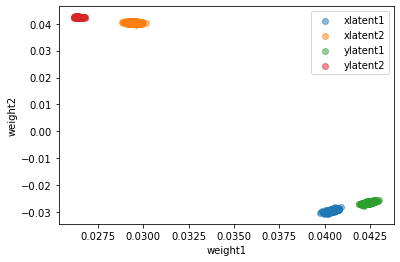

In [731]:
import matplotlib.pyplot as plt

X_loading = plsca.x_weights_
Y_loading = plsca.y_weights_
plt.scatter(X_loading[:nvar,0],X_loading[:nvar,1],alpha=0.5)
# plt.scatter(X_loading[nvar:2*nvar,0],X_loading[nvar:2*nvar,-1])
plt.scatter(X_loading[nvar:,0],X_loading[nvar:,1],alpha=0.5)
# plt.legend(['xlatent1','xlatent2'])#,'latent3'
# plt.show()
plt.scatter(Y_loading[:nvar,0],Y_loading[:nvar,1],alpha=0.5)
# plt.scatter(Y_loading[nvar:2*nvar,0],Y_loading[nvar:2*nvar,-1])
plt.scatter(Y_loading[nvar:,0],Y_loading[nvar:,1],alpha=0.5)
plt.legend(['xlatent1','xlatent2','ylatent1','ylatent2'])
plt.xlabel('weight1')
plt.ylabel('weight2')

Text(0.5, 1.0, 'Transformed')

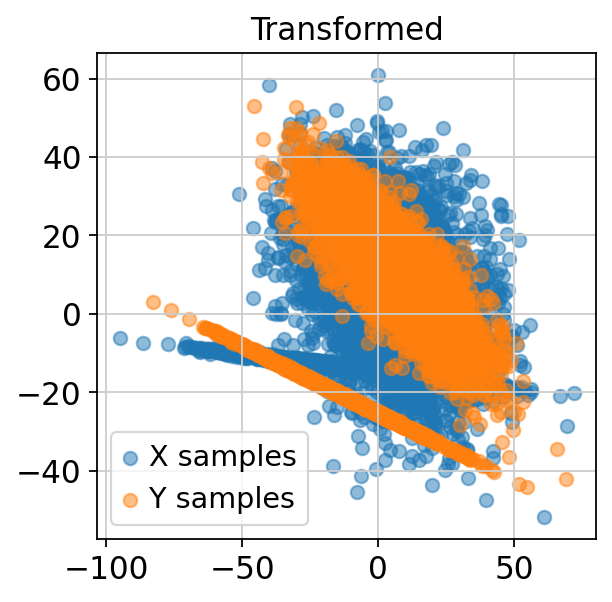

In [769]:
X_r, Y_r = plsca.transform(X, Y)


# plt.scatter(X_r[:,0],Y_r[:,0])

plt.scatter(X_r[:,0],X_r[:,1],alpha=0.5)
plt.scatter(Y_r[:,0],Y_r[:,1],alpha=0.5)
# plt.scatter(Y_r[:n,0],Y_r[:n,1],alpha=0.5)
# plt.scatter(Y_r[n:,0],Y_r[n:,1],alpha=0.5)

# plt.scatter(X.T[:,0],X.T[:,1],alpha=0.5)
# plt.scatter(Y.T[:,0],Y.T[:,1],alpha=0.5)
# plt.scatter(X_loading[nvar:2*nvar,0],X_loading[nvar:2*nvar,-1])
# plt.scatter(X_loading[nvar:,0],X_loading[nvar:,-1])
# plt.legend(['latent1','latent2','latent3'])
# plt.legend(['DE genes','noise genes'])
plt.legend(['X samples','Y samples'])
plt.title('Transformed')


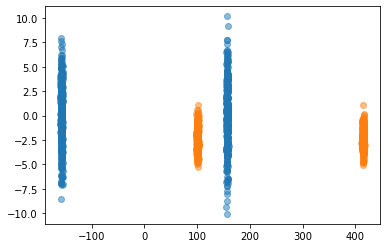

In [656]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(X.T)
X_d = pca.transform(X.T)
Y_d = pca.transform(Y.T)
# X_d = pca.fit_transform(X.T)
# pca = PCA(n_components=2)
# Y_d = pca.fit_transform(Y.T)
plt.scatter(X_d[:,0], X_d[:,1], alpha=0.5)
plt.scatter(Y_d[:,0], Y_d[:,1], alpha=0.5)

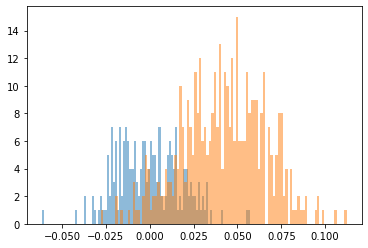

In [481]:
plt.hist(X_loading[:nvar,1],bins=100,alpha=0.5)
plt.hist(X_loading[nvar:,1],bins=100,alpha=0.5)
plt.show()

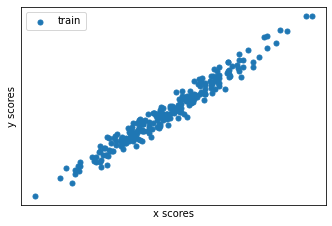

In [24]:
plt.figure(figsize=(12, 8))
plt.subplot(221)
# plt.scatter(X[:, 0], X[:, -1], label="train", marker="o", s=25)
plt.scatter(X_train_r[:, 1], Y_train_r[:, 1], label="train", marker="o", s=25)

plt.xlabel("x scores")
plt.ylabel("y scores")

plt.xticks(())
plt.yticks(())
plt.legend(loc="best")